## Example of audio augmentation

This notebook demonstrates how to perform audio augmentation using the `Muda` and `librosa` library.

In this example, we will perform the following audio augmentations:

1. Pitch shifting
2. Time stretching
3. Dynamic range compression


In [ ]:
from xai_music import Audiobank

audio_bank = Audiobank(config_file="configuration.yml")
audio_bank.synthesis(n_samples=1)

## Example of audio augmentation

In [1]:
import librosa
import numpy as np
import matplotlib.pyplot as plt
import librosa.display

from IPython import display

In [2]:
def plot_audio(path: str) -> None:
    # Load the audio file
    y, sr = librosa.load(path, sr=16000)
    # Compute the spectrogram
    spectrogram = librosa.stft(y)
    spectrogram_db = librosa.amplitude_to_db(abs(spectrogram))

    # Plotting
    fig, axes = plt.subplots(2, figsize=(12, 8))

    # Waveform plot
    timescale = np.arange(y.shape[0])
    axes[0].plot(timescale, y)
    axes[0].set_title("Waveform")
    axes[0].set_xlim([0, y.shape[0]])

    # Spectrogram plot
    img = librosa.display.specshow(
        spectrogram_db, sr=sr, x_axis="time", y_axis="hz", ax=axes[1]
    )
    axes[1].set_title("Spectrogram")
    fig.colorbar(img, ax=axes[1], format="%+2.0f dB")

    # Title and show
    plt.suptitle(path.split("/")[-1].title())
    plt.show()

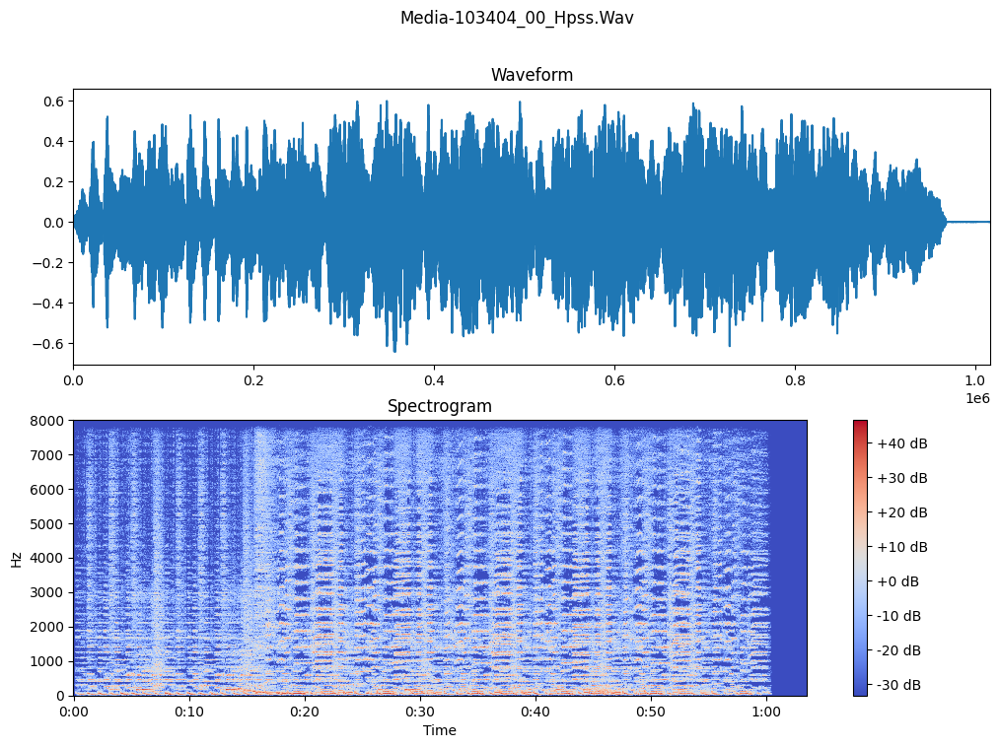

In [3]:
_MUSIC_PATH = r"audio/augments/wav/ChaChaCha/Media-103404_00_hpss.wav"

plot_audio(_MUSIC_PATH)
display.display(display.Audio(_MUSIC_PATH, rate=16000))

In [4]:
import json


def extract_info_from_file(file_path: str) -> tuple:
    with open(file_path, "r") as file:
        data = json.load(file)
        # Initialize variables to store the extracted information
        n_semitones, rate, preset = None, None, None
        # Loop through the history of transformations to extract the required information
        for transformation in (
            data.get("sandbox", {}).get("muda", {}).get("history", [])
        ):
            transformer_class = transformation.get("transformer", {}).get(
                "__class__", ""
            )
            if transformer_class == "LinearPitchShift":
                n_semitones = transformation.get("state", {}).get("n_semitones")
            elif transformer_class == "LogspaceTimeStretch":
                rate = transformation.get("state", {}).get("rate")
            elif transformer_class == "DynamicRangeCompression":
                preset = transformation.get("state", {}).get("preset")
        return n_semitones, rate, preset

Pitch Shift (Semitones): -2.0
Time Stretch Rate: 0.5
Dynamic Range Compression Preset: radio


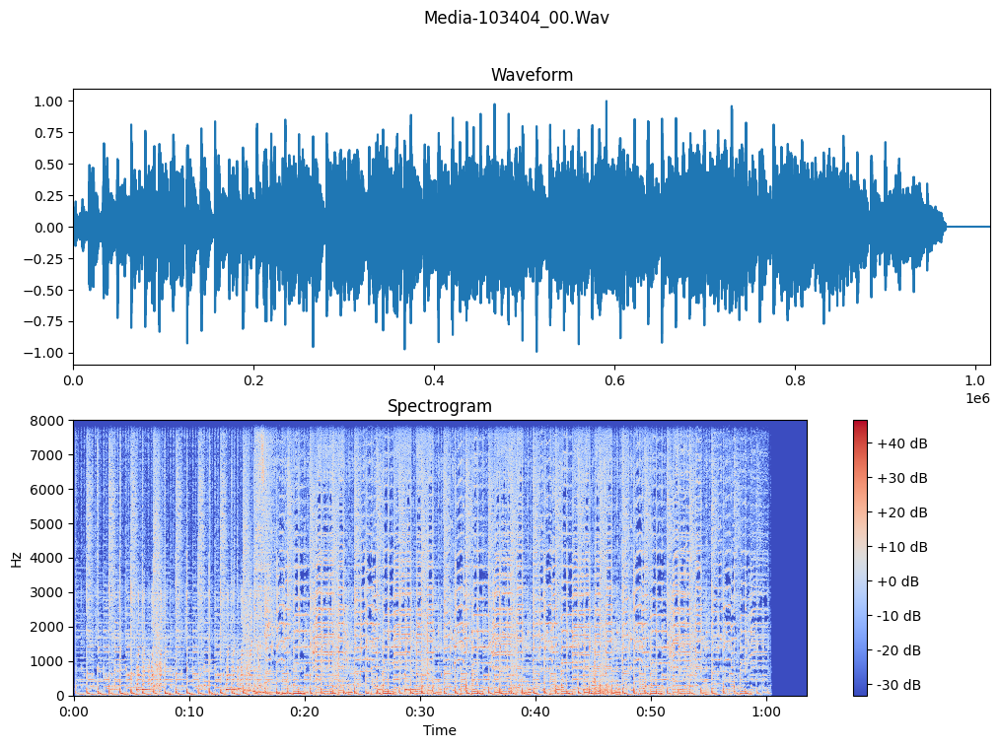

In [5]:
_MUSIC_PATH = r"audio/augments/wav/ChaChaCha/Media-103404_00.wav"
_JAM_PATH = r"audio/augments/meta/ChaChaCha/Media-103404_00.jams"
# Extract augmentation features from the jams file
n_semitones, rate, preset = extract_info_from_file(_JAM_PATH)
print(f"Pitch Shift (Semitones): {n_semitones}")
print(f"Time Stretch Rate: {rate}")
print(f"Dynamic Range Compression Preset: {preset}")

plot_audio(_MUSIC_PATH)
display.display(display.Audio(_MUSIC_PATH, rate=16000))

## Extract augmentation features

The augmentation features are as follows:
1. Key
2. Tempo
3. HPSS
4. DRC


In [6]:
import pandas as pd
import json
import os
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()


def extract_info_from_file(file_path: str) -> tuple:
    with open(file_path, "r") as file:
        data = json.load(file)
        # Initialize variables to store the extracted information
        n_semitones, rate, preset = None, None, None
        # Loop through the history of transformations to extract the required information
        for transformation in (
            data.get("sandbox", {}).get("muda", {}).get("history", [])
        ):
            transformer_class = transformation.get("transformer", {}).get(
                "__class__", ""
            )
            if transformer_class == "LinearPitchShift":
                n_semitones = transformation.get("state", {}).get("n_semitones")
            elif transformer_class == "LogspaceTimeStretch":
                rate = transformation.get("state", {}).get("rate")
            elif transformer_class == "DynamicRangeCompression":
                preset = transformation.get("state", {}).get("preset")
        return n_semitones, rate, preset


def create_dataframe_from_dir(directory_path: str, hpss_apply: bool) -> pd.DataFrame:
    # Define the DataFrame columns
    df = pd.DataFrame(
        columns=[
            "file_name",
            "type",
            "n_semitones",
            "rate",
            "preset",
            "hpss",
            "y_id",
            "y",
        ]
    )
    # Iterate over each file in the directory
    file_list = [
        os.path.join(root, file)
        for root, _, files in os.walk(directory_path)
        for file in files
        if file.endswith(".jams")
    ]
    
    for file_name in file_list:
        n_semitones, rate, preset = extract_info_from_file(file_name)
        # Extract type of music from the file path or name
        type_of_music = file_name.split("/")[-2]
        # Get the file name without extension
        base_file_name = os.path.splitext(os.path.basename(file_name))[0]
        # Append the extracted information to the DataFrame
        new_row = pd.DataFrame(
            {
                "n_semitones": [n_semitones],
                "rate": [rate],
                "preset": [preset],
                "type": [type_of_music],
                "file_name": [base_file_name],
            }
        )
        if hpss_apply:
            new_row["hpss"] = 0
            
            # Get the HPSS applied row
            hpss_row = new_row.copy()
            hpss_row["hpss"] = 1
            hpss_row["file_name"] = f"{base_file_name}_hpss"
            df = pd.concat([df, hpss_row], ignore_index=True)
            
        df = pd.concat([df, new_row], ignore_index=True)
    # Convert preset to index
    df["preset_id"] = le.fit_transform(df["preset"])
    return df

In [7]:
META_PATH = r"audio/augments/meta"
HPSS_APPLY = True

int_df = create_dataframe_from_dir(META_PATH,HPSS_APPLY)
model_features = ["file_name", "n_semitones", "rate", "preset"]
int_df

int_df.iloc[0]

/var/folders/pz/4plff07x5_b3hdby9tw8psvm0000gn/T/ipykernel_77401/1526134879.py:75: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, hpss_row], ignore_index=True)


file_name      Albums-Latin_Jam5-03_126_hpss
type                                   Rumba
n_semitones                             -1.0
rate                                     2.0
preset                                 radio
hpss                                       1
y_id                                     NaN
y                                        NaN
preset_id                                  4
Name: 0, dtype: object

### Loading music classification model trained on ballroom dataset

In [ ]:
import tensorflow as tf

model = tf.saved_model.load(r"saved")

model(r"audio/augments/wav/ChaChaCha/Media-103404_00.wav")



### Predict each augmented music file

In [ ]:
import os
from tqdm import tqdm

SAV_PATH=r'temp_predict_results.csv'

if os.path.exists(SAV_PATH):
    sav_df = pd.read_csv(SAV_PATH)
    # Get the list of filenames from sav_df
    existing_filenames = sav_df['file_name'].tolist()

    # Filter out rows in int_df that contain filenames in the existing_filenames list
    int_df = int_df[~int_df['file_name'].isin(existing_filenames)]
    int_df.reset_index(drop=True, inplace=True)
else:
    print(f"File {SAV_PATH} does not exist.")


for i, row in tqdm(int_df.iterrows(), total=int_df.shape[0]):
    
    
    # Join the path with the file name for each row in the DataFrame
    audio_file = os.path.join(
        r"audio/augments/wav", row["type"], row["file_name"] + ".wav"
    )
    prediction = model(audio_file)

    
    int_df.at[i, "y"] = prediction["class_names"].numpy()[0].decode("utf-8")
    int_df.at[i, "y_id"] = prediction["class_ids"].numpy()[0]
    # Get row i from the DataFrame
    current_row = pd.DataFrame(int_df.iloc[i]).T
    current_row.to_csv(SAV_PATH, mode='a', index=False, header=False)

In [8]:
# Load the augmentation results from the CSV file
import pandas as pd

SAV_PATH=r'temp_predict_results.csv'

df = pd.read_csv(SAV_PATH)
df = df.merge(int_df[['file_name', 'preset']], on='file_name', how='left')


df

,file_name,type,n_semitones,rate,preset_id,hpss,y_id,y,preset
0,Albums-Latin_Jam5-03_126_hpss,Rumba,-1.0,2.000000,4,1,5,Tango,radio
1,Albums-Latin_Jam5-03_126,Rumba,-1.0,2.000000,4,0,5,Tango,radio
2,Albums-Latin_Jam5-03_48_hpss,Rumba,1.0,0.707107,4,1,7,Waltz,radio
3,Albums-Latin_Jam5-03_48,Rumba,1.0,0.707107,4,0,0,ChaChaCha,radio
4,Albums-Latin_Jam5-03_130_hpss,Rumba,-1.0,2.000000,2,1,5,Tango,music light
...,...,...,...,...,...,...,...,...,...
2395,Albums-Chrisanne1-14_01,Quickstep,-2.0,0.500000,1,0,7,Waltz,film standard
2396,Albums-Chrisanne1-14_17_hpss,Quickstep,0.0,0.500000,5,1,7,Waltz,speech
2397,Albums-Chrisanne1-14_17,Quickstep,0.0,0.500000,5,0,6,VienneseWaltz,speech
2398,Albums-Chrisanne1-14_40_hpss,Quickstep,-1.0,0.707107,2,1,5,Tango,music light


## Get absolute values of the DRC

The DRC augmenting is implemented by `muda.deformers.DynamicRangeCompression`, and it's default setup is as follows:
1. The first parameter is a string that specifies the `attack` and `release` times for the compressor. It's in the format "attack,release", where "attack" and "release" are in `seconds`.
2. The second parameter is a string that specifies the points on the `transfer function`. It's in the format "x1,y1,x2,y2,...", where "x1,y1,x2,y2,..." are the x and y coordinates of the points on the transfer function. The x coordinates are in decibels, and the y coordinates are in decibels.
3. The third parameter is a string that specifies the `knee` of the compressor.
4. The fourth parameter is a string that specifies the `ratio` of the compressor.
5. The fifth parameter is a string that specifies the `makeup gain` of the compressor.



In [9]:
# A function to convert drc_presets into ti's co-related columns

drc_presets = {
    "radio": ["0.01,1", "-90,-90,-70,-70,-60,-20,0,0", "-5"],
    "film standard": [
        "0.1,0.3",
        "-90,-90,-70,-64,-43,-37,-31,-31,-21,-21,0,-20",
        "0",
        "0",
        "0.1",
    ],
    "film light": [
        "0.1,0.3",
        "-90,-90,-70,-64,-53,-47,-41,-41,-21,-21,0,-20",
        "0",
        "0",
        "0.1",
    ],
    "music standard": [
        "0.1,0.3",
        "-90,-90,-70,-58,-55,-43,-31,-31,-21,-21,0,-20",
        "0",
        "0",
        "0.1",
    ],
    "music light": [
        "0.1,0.3",
        "-90,-90,-70,-58,-65,-53,-41,-41,-21,-21,0,-11",
        "0",
        "0",
        "0.1",
    ],
    "speech": [
        "0.1,0.3",
        "-90,-90,-70,-55,-50,-35,-31,-31,-21,-21,0,-20",
        "0",
        "0",
        "0.1",
    ],
}


def convert_drc_presets(preset: str) -> dict:
    drc_preset = drc_presets[preset]
    drc_attack, drc_release = [float(i) for i in drc_preset[0].split(",")]
    if preset == "radio":
        tf_x1, tf_y1, tf_x2, tf_y2, tf_x3, tf_y3, tf_x4, tf_y4= map(int, drc_preset[1].split(","))
    else:
        tf_x1, tf_y1, tf_x2, tf_y2, tf_x3, tf_y3, tf_x4, tf_y4, tf_x5, tf_y5, tf_x6, tf_y6 = map(int, drc_preset[1].split(","))
    drc_knee = int(drc_preset[2])
    drc_ratio = float(drc_preset[3]) if len(drc_preset) > 3 else 0
    drc_makeup_gain = float(drc_preset[4]) if len(drc_preset) > 4 else 0
    return {
        "drc_attack": drc_attack,
        "drc_release": drc_release,
        "tf_x1": tf_x1,
        "tf_y1": tf_y1,
        "tf_x2": tf_x2,
        "tf_y2": tf_y2,
        "tf_x3": tf_x3,
        "tf_y3": tf_y3,
        "tf_x4": tf_x4,
        "tf_y4": tf_y4,
        "tf_x5": tf_x5 if preset != "radio" else 0,
        "tf_y5": tf_y5 if preset != "radio" else 0,
        "tf_x6": tf_x6 if preset != "radio" else 0,
        "tf_y6": tf_y6 if preset != "radio" else 0,
        "drc_knee": drc_knee,
        "drc_ratio": drc_ratio,
        "drc_makeup_gain": drc_makeup_gain,
    }


In [10]:
from tqdm import tqdm

preset_drc_lst=[]
for _, row in tqdm(df.iterrows(), total=len(df)):
    drc_preset = convert_drc_presets(row['preset'])
    drc_preset['file_name'] = row['file_name']
    preset_drc_lst.append(drc_preset)

df = df.merge(pd.DataFrame(preset_drc_lst), how='left', on='file_name')

df

100%|██████████| 2400/2400 [00:00<00:00, 51940.24it/s]


,file_name,type,n_semitones,rate,preset_id,hpss,y_id,y,preset,drc_attack,...,tf_y3,tf_x4,tf_y4,tf_x5,tf_y5,tf_x6,tf_y6,drc_knee,drc_ratio,drc_makeup_gain
0,Albums-Latin_Jam5-03_126_hpss,Rumba,-1.0,2.000000,4,1,5,Tango,radio,0.01,...,-20,0,0,0,0,0,0,-5,0.0,0.0
1,Albums-Latin_Jam5-03_126,Rumba,-1.0,2.000000,4,0,5,Tango,radio,0.01,...,-20,0,0,0,0,0,0,-5,0.0,0.0
2,Albums-Latin_Jam5-03_48_hpss,Rumba,1.0,0.707107,4,1,7,Waltz,radio,0.01,...,-20,0,0,0,0,0,0,-5,0.0,0.0
3,Albums-Latin_Jam5-03_48,Rumba,1.0,0.707107,4,0,0,ChaChaCha,radio,0.01,...,-20,0,0,0,0,0,0,-5,0.0,0.0
4,Albums-Latin_Jam5-03_130_hpss,Rumba,-1.0,2.000000,2,1,5,Tango,music light,0.10,...,-53,-41,-41,-21,-21,0,-11,0,0.0,0.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2395,Albums-Chrisanne1-14_01,Quickstep,-2.0,0.500000,1,0,7,Waltz,film standard,0.10,...,-37,-31,-31,-21,-21,0,-20,0,0.0,0.1
2396,Albums-Chrisanne1-14_17_hpss,Quickstep,0.0,0.500000,5,1,7,Waltz,speech,0.10,...,-35,-31,-31,-21,-21,0,-20,0,0.0,0.1
2397,Albums-Chrisanne1-14_17,Quickstep,0.0,0.500000,5,0,6,VienneseWaltz,speech,0.10,...,-35,-31,-31,-21,-21,0,-20,0,0.0,0.1
2398,Albums-Chrisanne1-14_40_hpss,Quickstep,-1.0,0.707107,2,1,5,Tango,music light,0.10,...,-53,-41,-41,-21,-21,0,-11,0,0.0,0.1


## Get absolute values of the tempo

We convert relative tempo to absolute values as BPM, extracting by `librosa.beat.beat_track`.

In [11]:
import librosa

def get_bpm(audio_path:str) -> float:
    y, sr = librosa.load(audio_path)
    bpm, _ = librosa.beat.beat_track(y=y, sr=sr)
    return bpm


In [12]:
bpm_lst=[]
for _, row in tqdm(df.iterrows(), total=len(df)):
    audio_file = os.path.join(
        r"audio/augments/wav", row["type"], row["file_name"] + ".wav"
    )
    bpm = get_bpm(audio_file)
    bpm_lst.append({'file_name': row['file_name'], 'bpm': bpm})

pd.DataFrame(bpm_lst)



100%|██████████| 2400/2400 [05:49<00:00,  6.87it/s]


,file_name,bpm
0,Albums-Latin_Jam5-03_126_hpss,103.359375
1,Albums-Latin_Jam5-03_126,135.999178
2,Albums-Latin_Jam5-03_48_hpss,143.554688
3,Albums-Latin_Jam5-03_48,73.828125
4,Albums-Latin_Jam5-03_130_hpss,103.359375
...,...,...
2395,Albums-Chrisanne1-14_01,99.384014
2396,Albums-Chrisanne1-14_17_hpss,99.384014
2397,Albums-Chrisanne1-14_17,103.359375
2398,Albums-Chrisanne1-14_40_hpss,143.554688


In [13]:
# Merge the bpm data into the main dataframe 'df' by matching 'file_name'
df = df.merge(pd.DataFrame(bpm_lst), on='file_name', how='left')

df

,file_name,type,n_semitones,rate,preset_id,hpss,y_id,y,preset,drc_attack,...,tf_x4,tf_y4,tf_x5,tf_y5,tf_x6,tf_y6,drc_knee,drc_ratio,drc_makeup_gain,bpm
0,Albums-Latin_Jam5-03_126_hpss,Rumba,-1.0,2.000000,4,1,5,Tango,radio,0.01,...,0,0,0,0,0,0,-5,0.0,0.0,103.359375
1,Albums-Latin_Jam5-03_126,Rumba,-1.0,2.000000,4,0,5,Tango,radio,0.01,...,0,0,0,0,0,0,-5,0.0,0.0,135.999178
2,Albums-Latin_Jam5-03_48_hpss,Rumba,1.0,0.707107,4,1,7,Waltz,radio,0.01,...,0,0,0,0,0,0,-5,0.0,0.0,143.554688
3,Albums-Latin_Jam5-03_48,Rumba,1.0,0.707107,4,0,0,ChaChaCha,radio,0.01,...,0,0,0,0,0,0,-5,0.0,0.0,73.828125
4,Albums-Latin_Jam5-03_130_hpss,Rumba,-1.0,2.000000,2,1,5,Tango,music light,0.10,...,-41,-41,-21,-21,0,-11,0,0.0,0.1,103.359375
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2395,Albums-Chrisanne1-14_01,Quickstep,-2.0,0.500000,1,0,7,Waltz,film standard,0.10,...,-31,-31,-21,-21,0,-20,0,0.0,0.1,99.384014
2396,Albums-Chrisanne1-14_17_hpss,Quickstep,0.0,0.500000,5,1,7,Waltz,speech,0.10,...,-31,-31,-21,-21,0,-20,0,0.0,0.1,99.384014
2397,Albums-Chrisanne1-14_17,Quickstep,0.0,0.500000,5,0,6,VienneseWaltz,speech,0.10,...,-31,-31,-21,-21,0,-20,0,0.0,0.1,103.359375
2398,Albums-Chrisanne1-14_40_hpss,Quickstep,-1.0,0.707107,2,1,5,Tango,music light,0.10,...,-41,-41,-21,-21,0,-11,0,0.0,0.1,143.554688


## Get absolute values of the key

We convert relative key to absolute values as Hz (compute by average over a `spectral centroid` over all time frames), extracting by `librosa.feature.spectral_centroid`.



In [14]:
import librosa
import numpy as np

def average_spectral_centroid(audio_path: str) -> float:
    # Load the audio file
    y, sr = librosa.load(audio_path)
    
    # Compute the spectral centroid
    spectral_centroids = librosa.feature.spectral_centroid(y=y, sr=sr)[0]
    
    # Calculate the average of the spectral centroids
    average_centroid = np.mean(spectral_centroids)
    
    return average_centroid

In [15]:
asc_list=[]
for _, row in tqdm(df.iterrows(), total=len(df)):
    audio_file = os.path.join(
        r"audio/augments/wav", row["type"], row["file_name"] + ".wav"
    )
    asc = average_spectral_centroid(audio_file)
    asc_list.append({'file_name': row['file_name'], 'asc': asc})

pd.DataFrame(asc_list)



100%|██████████| 2400/2400 [00:56<00:00, 42.58it/s]


,file_name,asc
0,Albums-Latin_Jam5-03_126_hpss,1199.247136
1,Albums-Latin_Jam5-03_126,1492.069424
2,Albums-Latin_Jam5-03_48_hpss,1366.585069
3,Albums-Latin_Jam5-03_48,1701.991294
4,Albums-Latin_Jam5-03_130_hpss,1200.746371
...,...,...
2395,Albums-Chrisanne1-14_01,2002.277155
2396,Albums-Chrisanne1-14_17_hpss,1904.242633
2397,Albums-Chrisanne1-14_17,2264.224232
2398,Albums-Chrisanne1-14_40_hpss,1839.123068


In [16]:
df = df.merge(pd.DataFrame(asc_list), on='file_name', how='left')

df

,file_name,type,n_semitones,rate,preset_id,hpss,y_id,y,preset,drc_attack,...,tf_y4,tf_x5,tf_y5,tf_x6,tf_y6,drc_knee,drc_ratio,drc_makeup_gain,bpm,asc
0,Albums-Latin_Jam5-03_126_hpss,Rumba,-1.0,2.000000,4,1,5,Tango,radio,0.01,...,0,0,0,0,0,-5,0.0,0.0,103.359375,1199.247136
1,Albums-Latin_Jam5-03_126,Rumba,-1.0,2.000000,4,0,5,Tango,radio,0.01,...,0,0,0,0,0,-5,0.0,0.0,135.999178,1492.069424
2,Albums-Latin_Jam5-03_48_hpss,Rumba,1.0,0.707107,4,1,7,Waltz,radio,0.01,...,0,0,0,0,0,-5,0.0,0.0,143.554688,1366.585069
3,Albums-Latin_Jam5-03_48,Rumba,1.0,0.707107,4,0,0,ChaChaCha,radio,0.01,...,0,0,0,0,0,-5,0.0,0.0,73.828125,1701.991294
4,Albums-Latin_Jam5-03_130_hpss,Rumba,-1.0,2.000000,2,1,5,Tango,music light,0.10,...,-41,-21,-21,0,-11,0,0.0,0.1,103.359375,1200.746371
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2395,Albums-Chrisanne1-14_01,Quickstep,-2.0,0.500000,1,0,7,Waltz,film standard,0.10,...,-31,-21,-21,0,-20,0,0.0,0.1,99.384014,2002.277155
2396,Albums-Chrisanne1-14_17_hpss,Quickstep,0.0,0.500000,5,1,7,Waltz,speech,0.10,...,-31,-21,-21,0,-20,0,0.0,0.1,99.384014,1904.242633
2397,Albums-Chrisanne1-14_17,Quickstep,0.0,0.500000,5,0,6,VienneseWaltz,speech,0.10,...,-31,-21,-21,0,-20,0,0.0,0.1,103.359375,2264.224232
2398,Albums-Chrisanne1-14_40_hpss,Quickstep,-1.0,0.707107,2,1,5,Tango,music light,0.10,...,-41,-21,-21,0,-11,0,0.0,0.1,143.554688,1839.123068


### Encode type

In [18]:
styles = {
    "Tango": 5,
    "Waltz": 7,
    "Rumba": 3,
    "Quickstep": 2,
    "Samba": 4,
    "Jive": 1,
    "ChaChaCha": 0,
    "VienneseWaltz": 6,
}

# Encode the 'type' column in df based on the styles dictionary
df["type_encoded"] = df["type"].map(styles)

df
# df.to_csv(r'augmentation_features.csv', index=False)



### LIME Implementation

This `lime_explanation` function is based on the [Local Surrogate (LIME)](https://christophm.github.io/interpretable-ml-book/lime.html) algorithm.



In [57]:
import numpy as np
from sklearn.linear_model import Lasso


def lime_explanation(local_data, predictions, instance, num_features, alpha=0.1):
    # Ensure local_data and instance are numpy arrays of type float
    if isinstance(local_data, pd.DataFrame):
        local_data = local_data.values.astype(float)
    if isinstance(instance, pd.Series):
        instance = instance.values.astype(float)

    # Step 1: Compute distances (weights) based on proximity to the instance
    distances = np.sqrt(np.sum((local_data - instance) ** 2, axis=1))
    weights = np.exp(-(distances ** 2) / np.std(distances))

    # Step 2: Train a weighted, interpretable model (Lasso)
    explanation_model = Lasso(alpha=alpha, max_iter=10000, fit_intercept=True)
    explanation_model.fit(local_data, predictions, sample_weight=weights)

    # Step 3: Reduce the number of features to num_features using feature selection
    # Here, we use Lasso's inherent feature selection
    # Retrain if necessary to adjust the number of features
    while np.count_nonzero(explanation_model.coef_) > num_features:
        alpha += 0.01  # Increase regularization
        explanation_model = Lasso(alpha=alpha, max_iter=10000, fit_intercept=True)
        explanation_model.fit(local_data, predictions, sample_weight=weights)

    return explanation_model.coef_

### Compute all augmented files

In [58]:
features = ["n_semitones", "rate", "preset", "type_encoded"]
features=['preset_id', 'bpm', 'asc', 'type_encoded','drc_makeup_gain']


coef = lime_explanation(df[features], df["y_id"], df.iloc[0][features], len(features))
pd.DataFrame([coef], columns=features)



,preset_id,bpm,asc,type_encoded,drc_makeup_gain
0,-0.019194,0.001062,0.004299,-0.0,0.0


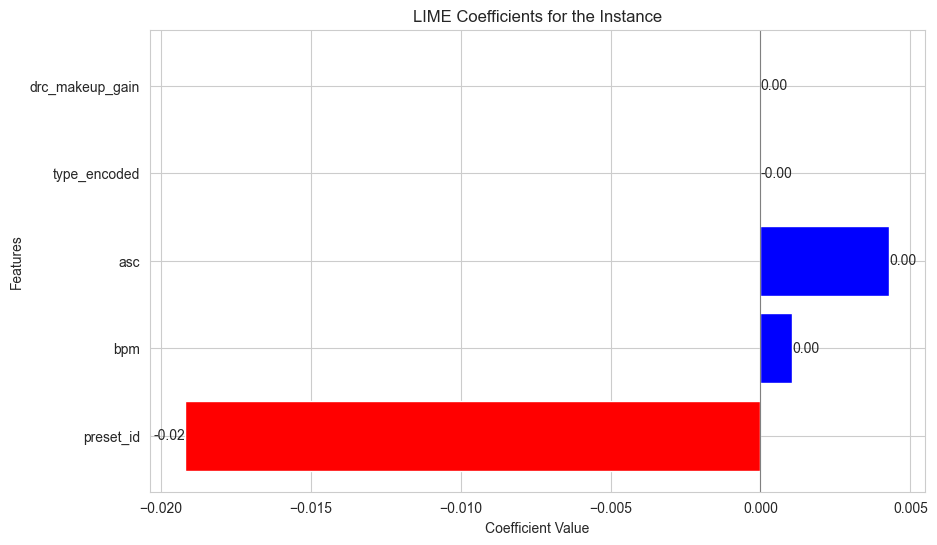

In [59]:
import matplotlib.pyplot as plt

# Plotting the coefficients as a horizontal bar chart with color coding based on sign
plt.figure(figsize=(10, 6))
colors = ['red' if x < 0 else 'blue' for x in coef]
bars = plt.barh(features, coef, color=colors)
plt.axvline(0, color='gray', linewidth=0.8)  # Adding a vertical line at zero

# Adding the value on each bar
for bar, value in zip(bars, coef):
    plt.text(value, bar.get_y() + bar.get_height()/2, f'{value:.2f}', 
             va='center', ha='right' if value < 0 else 'left')

plt.ylabel('Features')
plt.xlabel('Coefficient Value')
plt.title('LIME Coefficients for the Instance')
plt.show()

### Separate table by class type

In [60]:
separated_dfs = {
    type_code: group for type_code, group in df.groupby("type_encoded")
}

### Compute coefficients for each class type

In [61]:
coef_by_type_code = {}
for k, v in separated_dfs.items():
    coef_by_type_code[k] = lime_explanation(
        v[features], v["y_id"], v.iloc[0][features], 4
    )
    
coef_by_type_code

{0: array([-0.        , -0.        , -0.04371562,  0.        ,  0.        ]),
 1: array([ 0.03049636, -0.        , -0.03357485,  0.        , -0.        ]),
 2: array([-0.        ,  0.26577252,  0.18698209,  0.        ,  0.        ]),
 3: array([0.        , 0.        , 0.17921073, 0.        , 0.        ]),
 4: array([-0.       , -0.       ,  0.0298685,  0.       ,  0.       ]),
 5: array([-0., -0., -0.,  0.,  0.]),
 6: array([ 0.        , -0.        ,  0.00602139,  0.        , -0.        ]),
 7: array([-0., -0., -0.,  0.,  0.])}

In [62]:
import pandas as pd

# Convert the dictionary of coefficients into a DataFrame
coef_df = pd.DataFrame.from_dict(coef_by_type_code, orient='index', columns=features)
coef_df.index.name = 'type_id'
coef_df.reset_index(inplace=True)
# Reverse the styles dictionary to map from type_id to type
id_to_type = {v: k for k, v in styles.items()}

# Add 'type' column to coef_df
coef_df['type'] = coef_df['type_id'].map(id_to_type)

# Display the updated DataFrame
coef_df


,type_id,preset_id,bpm,asc,type_encoded,drc_makeup_gain,type
0,0,-0.000000,-0.000000,-0.043716,0.0,0.0,ChaChaCha
1,1,0.030496,-0.000000,-0.033575,0.0,-0.0,Jive
2,2,-0.000000,0.265773,0.186982,0.0,0.0,Quickstep
3,3,0.000000,0.000000,0.179211,0.0,0.0,Rumba
4,4,-0.000000,-0.000000,0.029868,0.0,0.0,Samba
5,5,-0.000000,-0.000000,-0.000000,0.0,0.0,Tango
6,6,0.000000,-0.000000,0.006021,0.0,-0.0,VienneseWaltz
7,7,-0.000000,-0.000000,-0.000000,0.0,0.0,Waltz


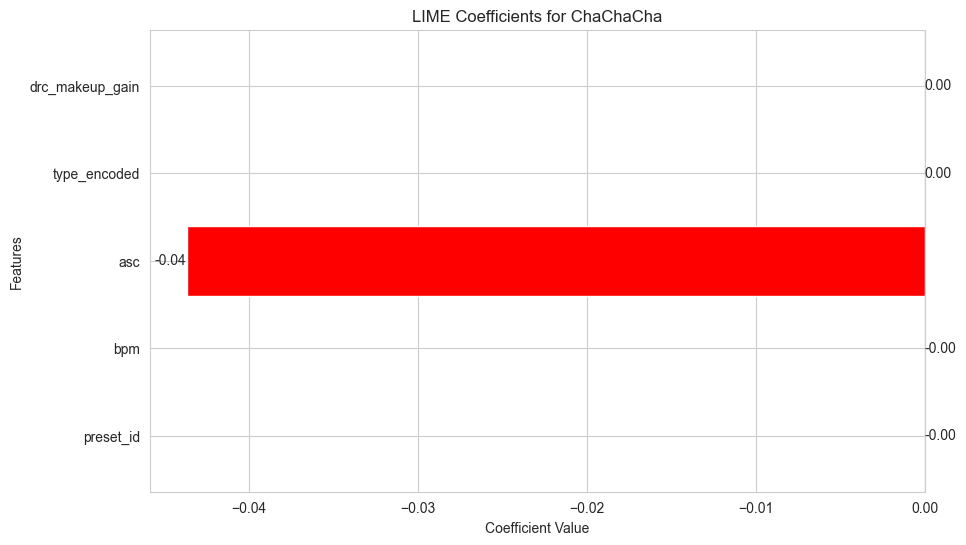

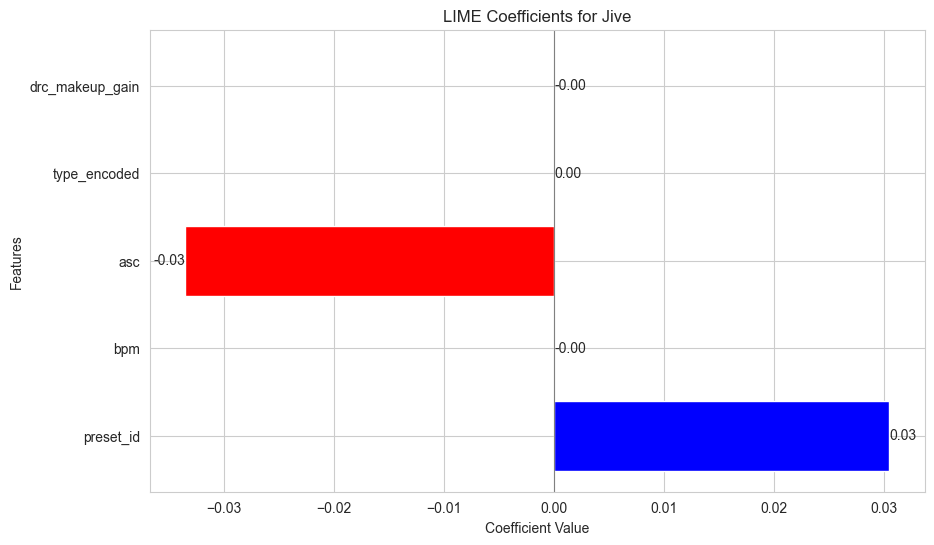

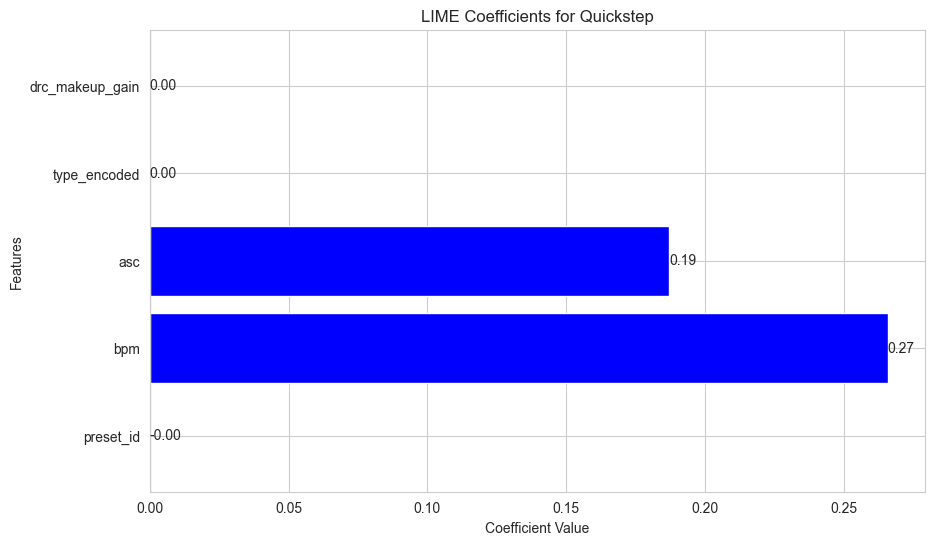

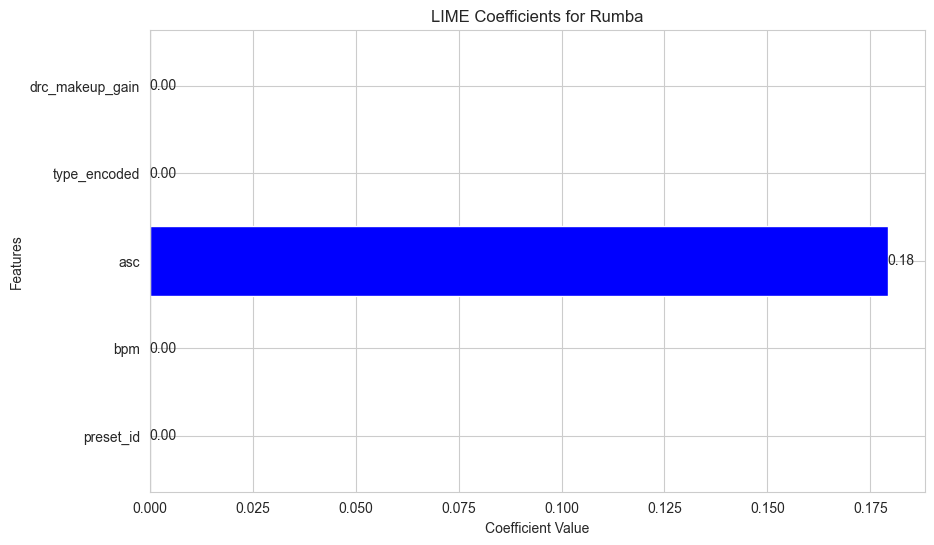

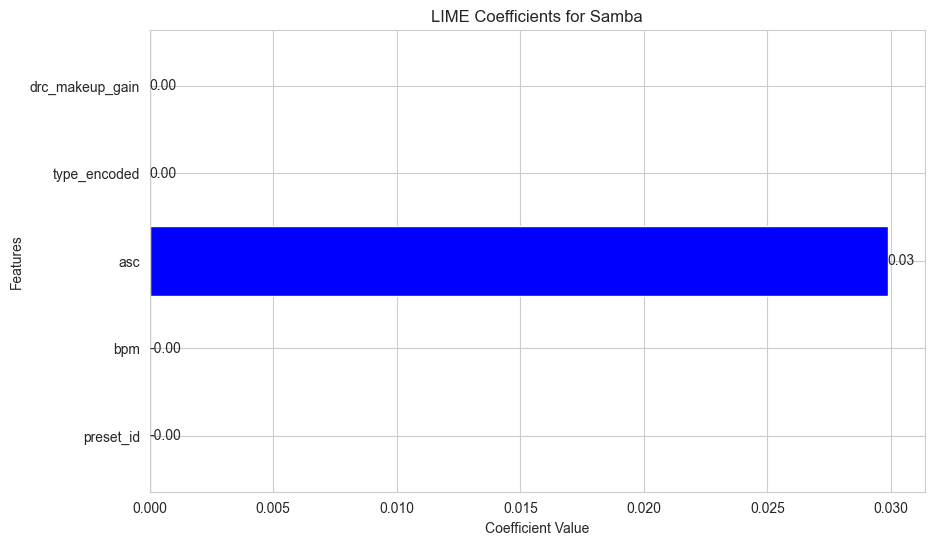

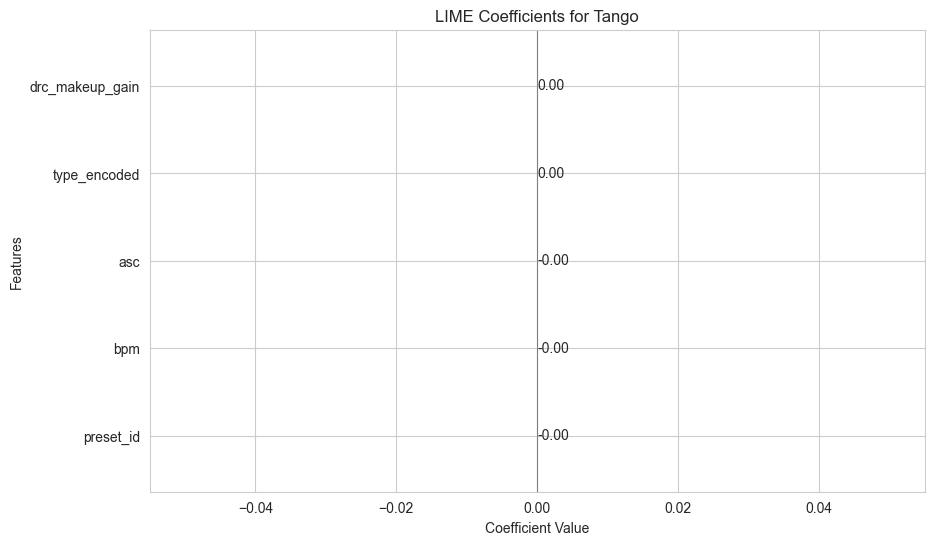

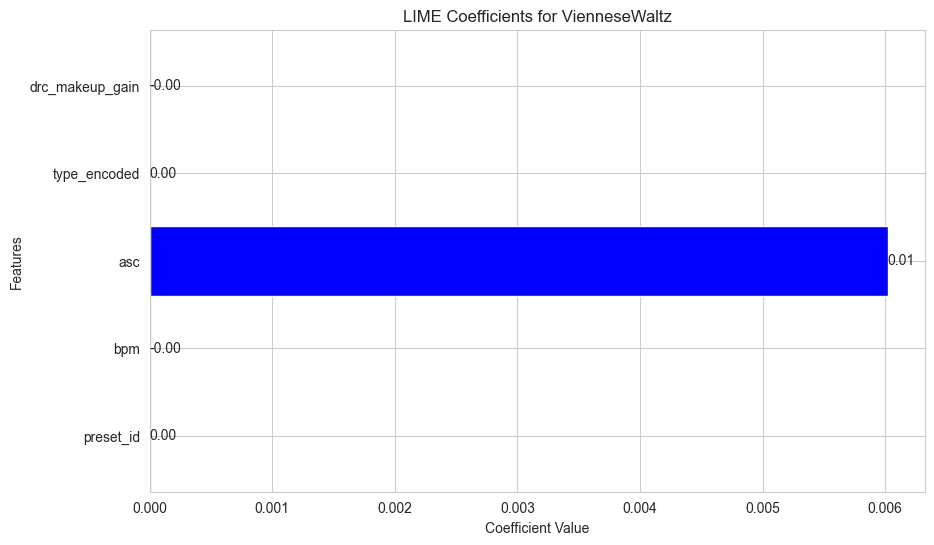

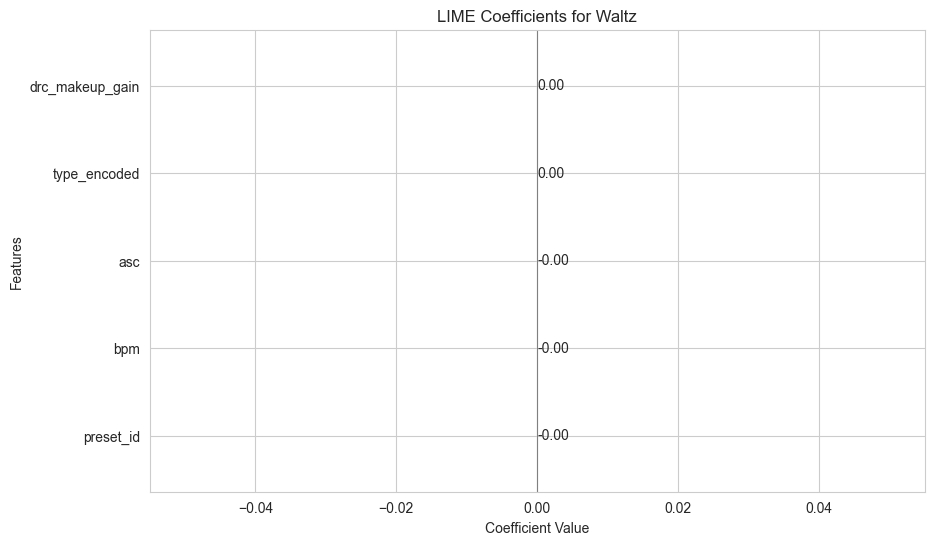

In [63]:
import matplotlib.pyplot as plt

# Loop through each row in coef_df to plot the coefficients for each type
for index, row in coef_df.iterrows():
    plt.figure(figsize=(10, 6))
    type_name = row['type']
    # Drop 'type_id' and 'type' columns for plotting
    row = row.drop(['type_id', 'type'])
    colors = ['red' if x < 0 else 'blue' for x in row]
    bars = plt.barh(row.index, row, color=colors)
    plt.axvline(0, color='gray', linewidth=0.8)  # Adding a vertical line at zero

    # Adding the value on each bar
    for bar, value in zip(bars, row):
        plt.text(value, bar.get_y() + bar.get_height()/2, f'{value:.2f}', 
                 va='center', ha='right' if value < 0 else 'left')

    plt.ylabel('Features')
    plt.xlabel('Coefficient Value')
    plt.title(f'LIME Coefficients for {type_name}')
    plt.show()


## Order by prediction result in each class

In [28]:
import pandas as pd

df = pd.read_csv('./augmentation_features.csv')
df

,file_name,type,n_semitones,rate,preset_id,hpss,y_id,y,preset,drc_attack,...,tf_x5,tf_y5,tf_x6,tf_y6,drc_knee,drc_ratio,drc_makeup_gain,bpm,asc,type_encoded
0,Albums-Latin_Jam5-03_126_hpss,Rumba,-1.0,2.000000,4,1,5,Tango,radio,0.01,...,0,0,0,0,-5,0.0,0.0,103.359375,1199.247136,3
1,Albums-Latin_Jam5-03_126,Rumba,-1.0,2.000000,4,0,5,Tango,radio,0.01,...,0,0,0,0,-5,0.0,0.0,135.999178,1492.069424,3
2,Albums-Latin_Jam5-03_48_hpss,Rumba,1.0,0.707107,4,1,7,Waltz,radio,0.01,...,0,0,0,0,-5,0.0,0.0,143.554688,1366.585069,3
3,Albums-Latin_Jam5-03_48,Rumba,1.0,0.707107,4,0,0,ChaChaCha,radio,0.01,...,0,0,0,0,-5,0.0,0.0,73.828125,1701.991294,3
4,Albums-Latin_Jam5-03_130_hpss,Rumba,-1.0,2.000000,2,1,5,Tango,music light,0.10,...,-21,-21,0,-11,0,0.0,0.1,103.359375,1200.746371,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2395,Albums-Chrisanne1-14_01,Quickstep,-2.0,0.500000,1,0,7,Waltz,film standard,0.10,...,-21,-21,0,-20,0,0.0,0.1,99.384014,2002.277155,2
2396,Albums-Chrisanne1-14_17_hpss,Quickstep,0.0,0.500000,5,1,7,Waltz,speech,0.10,...,-21,-21,0,-20,0,0.0,0.1,99.384014,1904.242633,2
2397,Albums-Chrisanne1-14_17,Quickstep,0.0,0.500000,5,0,6,VienneseWaltz,speech,0.10,...,-21,-21,0,-20,0,0.0,0.1,103.359375,2264.224232,2
2398,Albums-Chrisanne1-14_40_hpss,Quickstep,-1.0,0.707107,2,1,5,Tango,music light,0.10,...,-21,-21,0,-11,0,0.0,0.1,143.554688,1839.123068,2


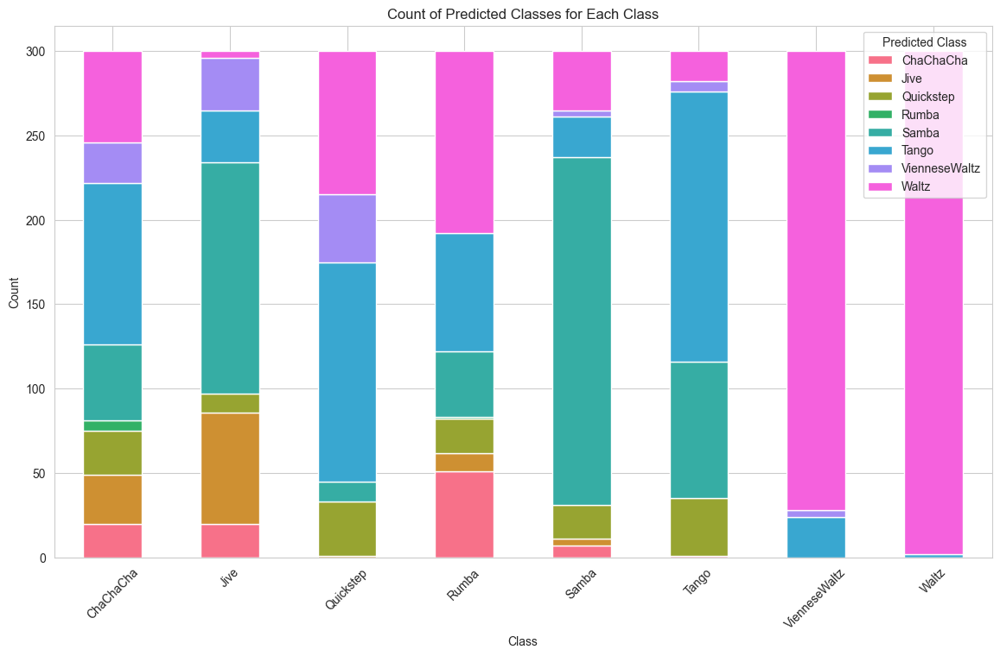

In [52]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the aesthetic style of the plots
sns.set_style("whitegrid")

def plot_bar_chart_by_class(df):
    # Group by 'type' and then plot the count of 'y' values for each type
    grouped = df.groupby('type')['y'].value_counts().unstack().fillna(0)
    colors = sns.color_palette("husl", len(grouped.columns))
    grouped.plot(kind='bar', figsize=(14, 8), stacked=True, color=colors)
    plt.title('Count of Predicted Classes for Each Class')
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Class')
    plt.show()

# Call the function to plot the chart
plot_bar_chart_by_class(df)


## When `Semitones` is greater than 0



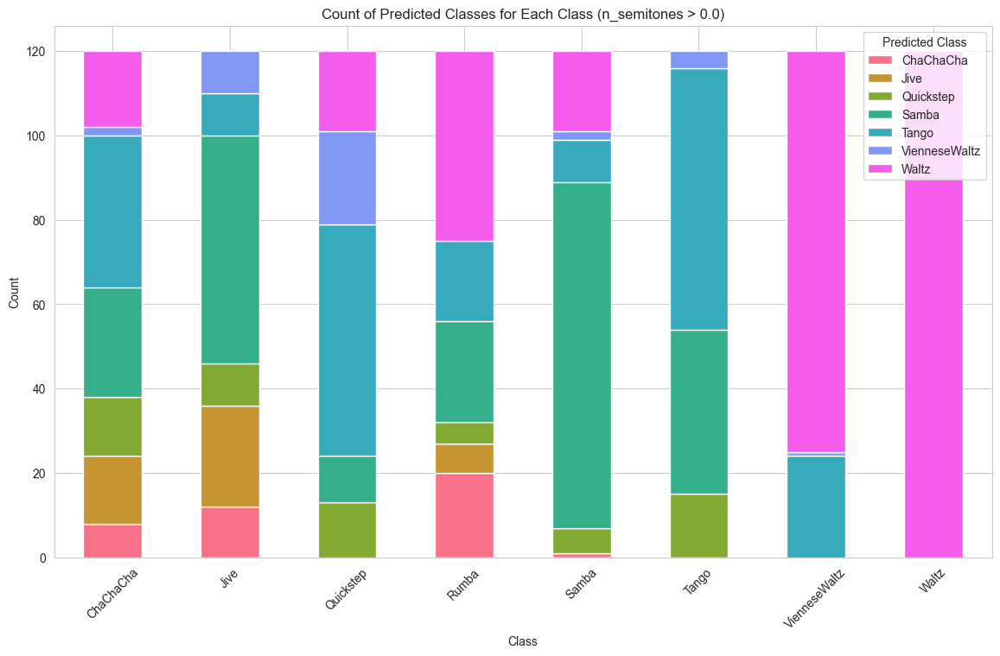

In [53]:
def plot_bar_chart_by_semitone(df):
    # Filter the dataframe to only include rows where n_semitones is greater than 0.0
    df_filtered = df[df['n_semitones'] > 0.0]
    # df_filtered = df_filtered[df_filtered['rate'] == 1.0]
    # Group by 'type' and then plot the count of 'y' values for each type
    grouped = df_filtered.groupby('type')['y'].value_counts().unstack().fillna(0)
    colors = sns.color_palette("husl", len(grouped.columns))
    grouped.plot(kind='bar', figsize=(14, 8), stacked=True, color=colors)
    plt.title('Count of Predicted Classes for Each Class (n_semitones > 0.0)')
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Class')
    plt.show()

# Call the function to plot the chart
plot_bar_chart_by_semitone(df)


## When `Semitones` change is lower than 0



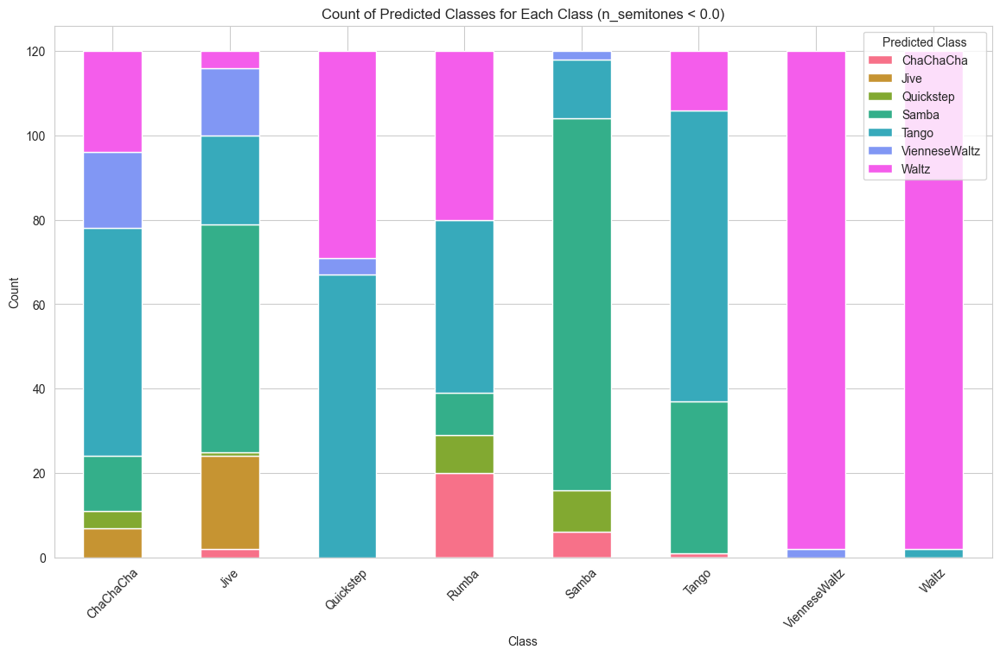

In [54]:
def plot_bar_chart_by_semitone(df):
    # Filter the dataframe to only include rows where n_semitones is greater than 0.0
    df_filtered = df[df['n_semitones'] < 0.0]
    # df_filtered = df_filtered[df_filtered['rate'] == 1.0]
    # Group by 'type' and then plot the count of 'y' values for each type
    grouped = df_filtered.groupby('type')['y'].value_counts().unstack().fillna(0)
    colors = sns.color_palette("husl", len(grouped.columns))
    grouped.plot(kind='bar', figsize=(14, 8), stacked=True, color=colors)
    plt.title('Count of Predicted Classes for Each Class (n_semitones < 0.0)')
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Class')
    plt.show()

# Call the function to plot the chart
plot_bar_chart_by_semitone(df)


## When `rate` is greater than 1.0

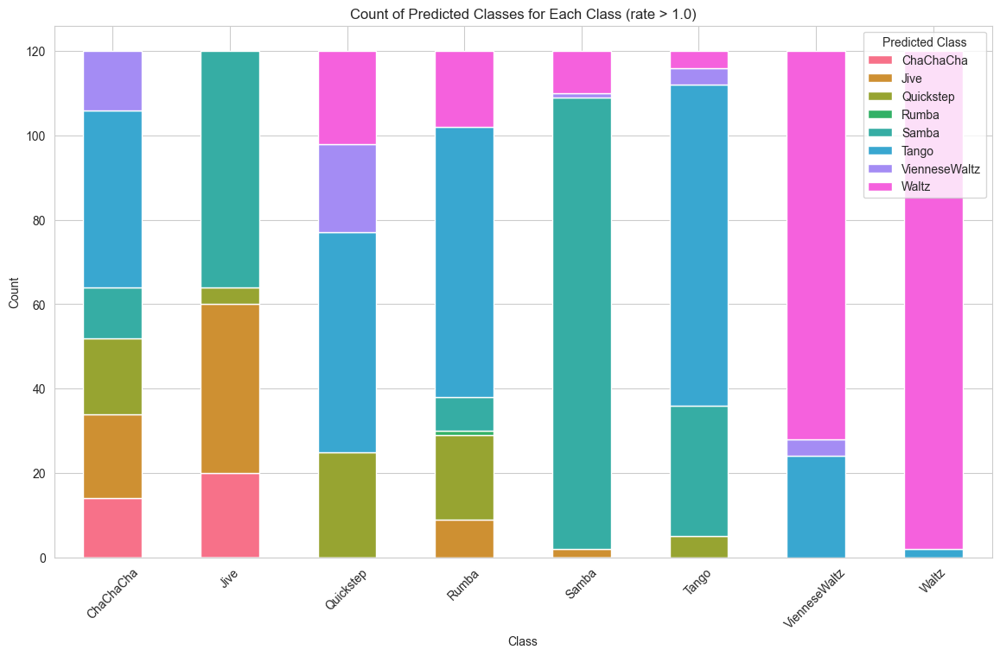

In [55]:
def plot_bar_chart_by_semitone(df):
    # Filter the dataframe to only include rows where n_semitones is greater than 0.0
    df_filtered = df[df['rate'] > 1.0]
    # df_filtered = df_filtered[df_filtered['n_semitones'] == 0.0]
    # Group by 'type' and then plot the count of 'y' values for each type
    grouped = df_filtered.groupby('type')['y'].value_counts().unstack().fillna(0)
    colors = sns.color_palette("husl", len(grouped.columns))
    grouped.plot(kind='bar', figsize=(14, 8), stacked=True, color=colors)
    plt.title('Count of Predicted Classes for Each Class (rate > 1.0)')
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Class')
    plt.show()

# Call the function to plot the chart
plot_bar_chart_by_semitone(df)


## When `rate` is less than 1.0



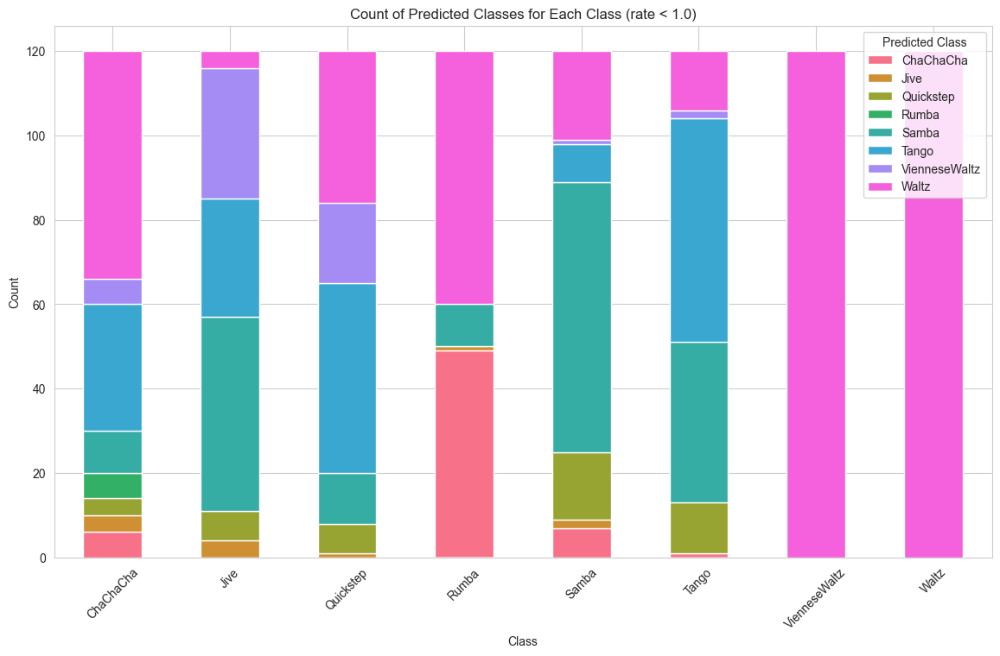

In [56]:
def plot_bar_chart_by_semitone(df):
    # Filter the dataframe to only include rows where n_semitones is greater than 0.0
    df_filtered = df[df['rate'] < 1.0]
    # df_filtered = df_filtered[df_filtered['n_semitones'] == 0.0]
    # Group by 'type' and then plot the count of 'y' values for each type
    grouped = df_filtered.groupby('type')['y'].value_counts().unstack().fillna(0)
    colors = sns.color_palette("husl", len(grouped.columns))
    grouped.plot(kind='bar', figsize=(14, 8), stacked=True, color=colors)
    plt.title('Count of Predicted Classes for Each Class (rate < 1.0)')
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Class')
    plt.show()

# Call the function to plot the chart
plot_bar_chart_by_semitone(df)


## When implementing HPSS

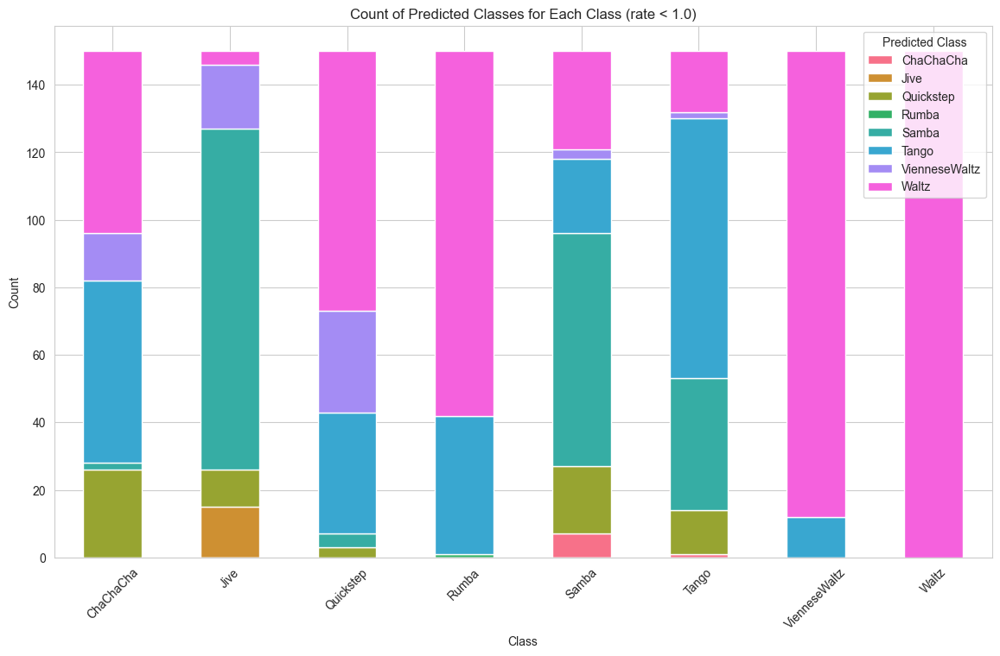

In [64]:
def plot_bar_chart_by_semitone(df):
    # Filter the dataframe to only include rows where n_semitones is greater than 0.0
    df_filtered = df[df['hpss'] == 1]
    # df_filtered = df_filtered[df_filtered['n_semitones'] == 0.0]
    # Group by 'type' and then plot the count of 'y' values for each type
    grouped = df_filtered.groupby('type')['y'].value_counts().unstack().fillna(0)
    colors = sns.color_palette("husl", len(grouped.columns))
    grouped.plot(kind='bar', figsize=(14, 8), stacked=True, color=colors)
    plt.title('Count of Predicted Classes for Each Class (with HPSS)')
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Class')
    plt.show()

# Call the function to plot the chart
plot_bar_chart_by_semitone(df)


## When without implementing HPSS

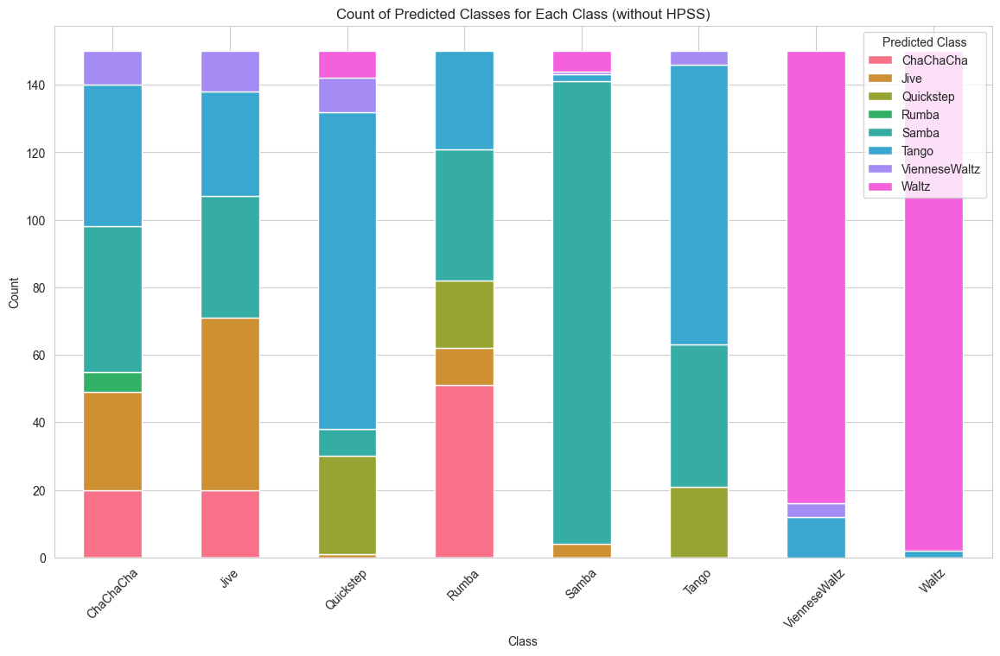

In [65]:
def plot_bar_chart_by_semitone(df):
    # Filter the dataframe to only include rows where n_semitones is greater than 0.0
    df_filtered = df[df['hpss'] == 0]
    # df_filtered = df_filtered[df_filtered['n_semitones'] == 0.0]
    # Group by 'type' and then plot the count of 'y' values for each type
    grouped = df_filtered.groupby('type')['y'].value_counts().unstack().fillna(0)
    colors = sns.color_palette("husl", len(grouped.columns))
    grouped.plot(kind='bar', figsize=(14, 8), stacked=True, color=colors)
    plt.title('Count of Predicted Classes for Each Class (without HPSS)')
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Class')
    plt.show()

# Call the function to plot the chart
plot_bar_chart_by_semitone(df)
